# Inversion on Unimak Island

This is the noteboook that solves the inversion for the Unimak datasets

## Load libraries

In [1]:
%matplotlib widget
import numpy as np
import corner
import matplotlib.pyplot as plt
import matplotlib
import h5py
from vmod import util

# InSAR (descending) data object

Here we load the csv file into an Insar object

In [2]:
from vmod.data import Insar
#xs,ys,azs,lks,los,elos,ref=util.read_dataset_csv('fisher.txt')
#xs,ys,azs,lks,los,elos,ref=util.read_dataset_csv('fisher_ref.txt')
#obs=Insar()
#obs.add_vecs(azs,lks)
#obs.add_xs(xs)
#obs.add_ys(ys)
#obs.add_los(los)
#obs.add_ref(ref)
#obs=util.csv2insar('fisher.txt')
mask_des='examples/insar/mask_unimak_des.npy'
csvfile_des='examples/insar/unimak_des_ref.csv'
obsin_des=Insar()
obsin_des.importcsv(csvfile_des,ori=[-164.5,54.7])
#obsin.err=obsin.err*0.0+1.0

In [3]:
#Locations in lat/lon for the sources
#Variable for source locations
points=[(obsin_des.ori[0],obsin_des.ori[1])]
#Labels for the points
lpoints=['Origin(x=0, y=0)']

#Coordinates of origin in UTM
x0,y0,z1,z2=util.ll2utm([obsin_des.ori[0]],[obsin_des.ori[1]])

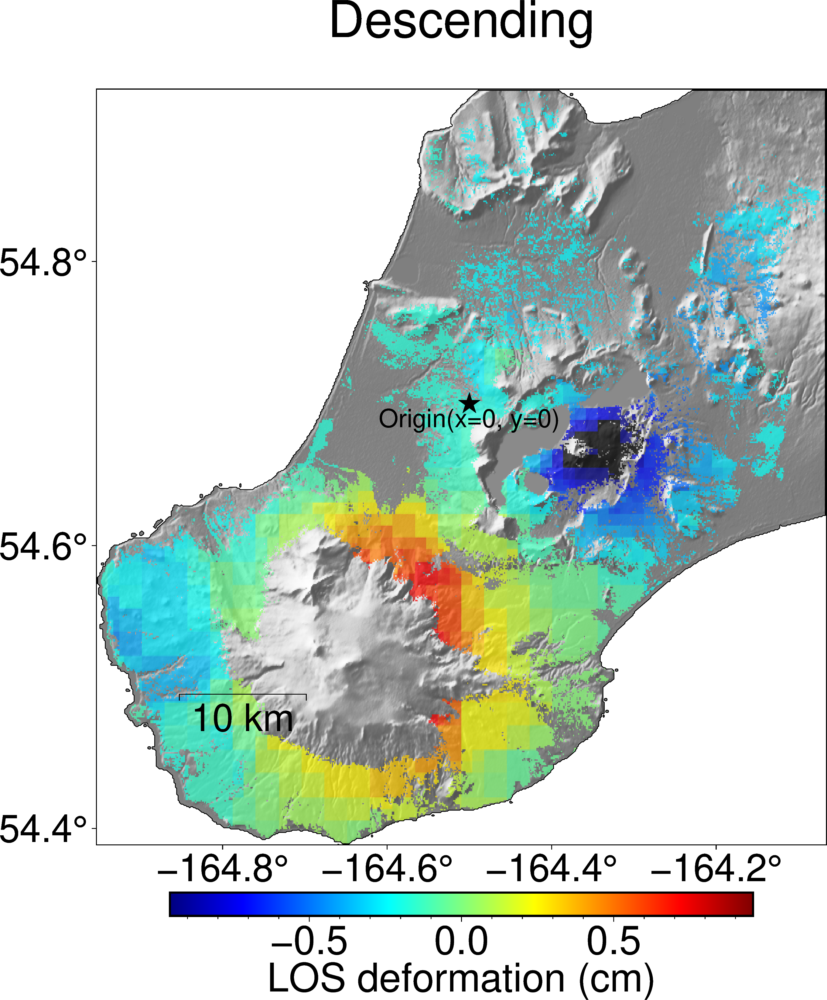

In [4]:
util.plot_insar_pygmt(csvfile_des, obsin_des.get_data(), maskfile=mask_des, title='Descending', points=points, lpoints=lpoints)

# InSAR (ascending) data object

Here we load the downsampled InSAR dataset into an Insar object

In [5]:
from vmod.data import Insar

#Creating observation object in this case an 
#InSAR dataset 
obsin_asc=Insar()

#Add azimuth and incidence angles
#obsin_asc.add_vecs(azs,lks)

#Add x and y coordinates
#obsin_asc.add_xs(xs)
#obsin_asc.add_ys(ys)

#Add LOS deformation data
#obsin_asc.add_los(los)

#Add reference point in (x,y) coordinates
#obsin_asc.add_ref(ref)

#Import csv into observation object
mask_asc='examples/insar/mask_unimak_asc.npy'
csvfile_asc='examples/insar/unimak_asc_ref.csv'
obsin_asc.importcsv(csvfile_asc,ori=[-164.5,54.7])

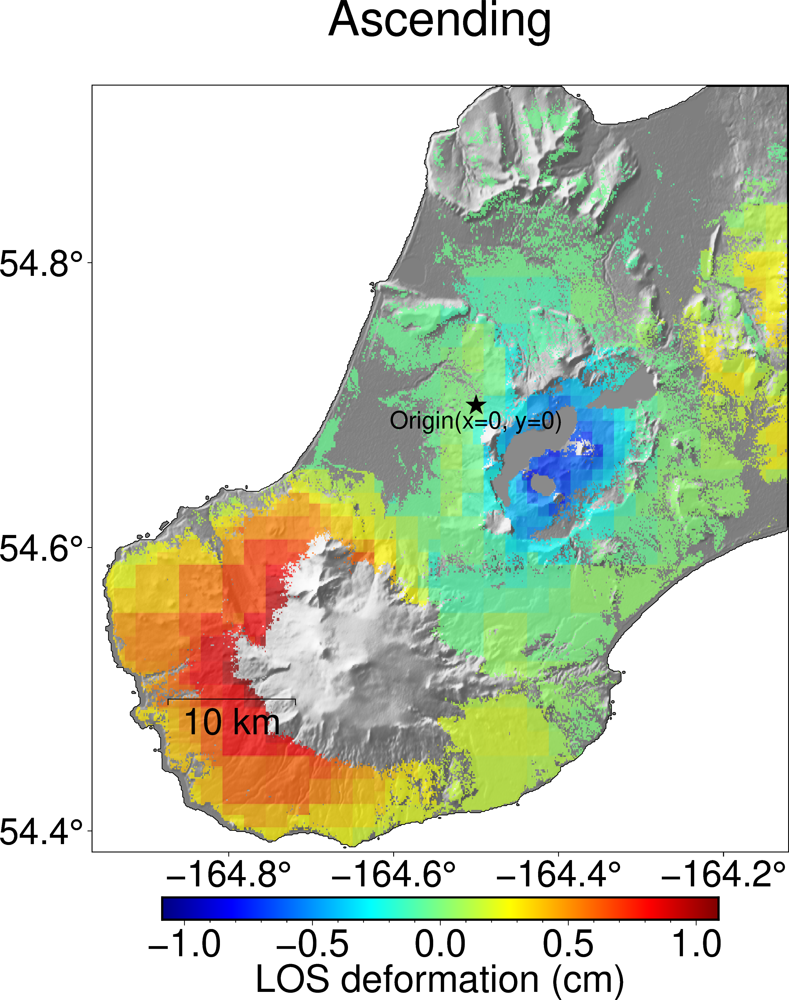

In [6]:
util.plot_insar_pygmt(csvfile_asc, obsin_asc.get_data(), maskfile=mask_asc, title='Ascending', points=points, lpoints=lpoints)

# GNSS data object

In this step we load the text file containing the GNSS velocities

In [7]:
from vmod.data import Gnss

csvfile_gnss='examples/gps/unimak_gnss_NOAM.txt'
#names,lons,lats,uxs,uys,uzs,euxs,euys,euzs=util.read_gnss_csv(csvfile,trans=False)

#Creating observation object in this case 
#an GNSS dataset 
obsg=Gnss()

#Add the names of the stations
#obsg.add_names(names)

#Add the x and y coordinates 
#of the stations
#obsg.add_xs(xs)
#obsg.add_ys(ys)

#Add deformation dataset in east (uxs), 
#north (uys) and vertical (uzs)
#obsg.add_ux(uxs)
#obsg.add_uy(uys)
#obsg.add_uz(uzs)

#Add uncertainties in east (euxs), 
#north (euys) and vertical (euzs)
#obsg.add_errx(euxs)
#obsg.add_erry(euys)
#obsg.add_errz(euzs)

#Import csv into the observation object
obsg.importcsv(csvfile_gnss,ori=[-164.5,54.7])
obsg.add_ref('AB06')

grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from -165.18673 to -165.1875
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from -164.0197 to -164.019166667
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from 54.3723509997 to 54.3716666667
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from 54.8385004769 to 54.8391666667


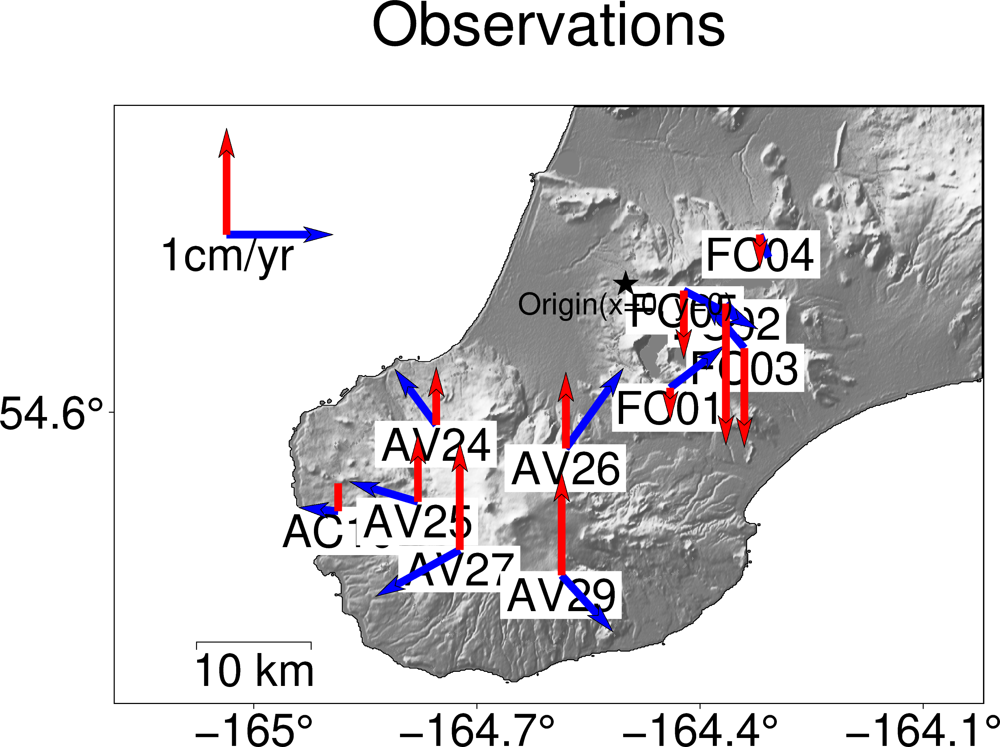

In [8]:
uxs,uys,uzs=obsg.get_data(unravel=False)
util.plot_gnss_pygmt(csvfile_gnss,title='Observations',uxs=uxs,uys=uys,uzs=uzs,ignore=['AB06'],points=points,lpoints=lpoints)

# Defining Joint dataset object

In this step, we create a Joint object with the InSAR dataset (ascending and descending) and the GNSS dataset

In [9]:
from vmod.data import Joint

#Creating observation object in 
#this case a Joint dataset
obs=Joint()

#obsin_asc.add_err(obsin_asc.err*0+1)
#obsin_des.add_err(obsin_des.err*0+1)

#Adding each dataset object, the 
#user has to provide the relative
#weight of each dataset
obs.add_dataset(obsin_des,wt=1.0)
obs.add_dataset(obsin_asc,wt=1.0)
obs.add_dataset(obsg,wt=(len(obsin_des.xs)+len(obsin_asc.xs))/(10*len(obsg.xs)))

# Model and Inverse objects

Here we create the model and inverse objects to run the inversions. We created some auxiliary objects for plotting purposes.

In [10]:
from vmod.source import Mctigue
from vmod.source import Penny
from vmod.source import Okada
from vmod.source import Yang
from vmod.inverse import Inverse

################# Model objects just for plotting##########################################

#Objects to plot GNSS data
ygg = Yang(obsg)
mctg = Mctigue(obsg)

invg=Inverse(obsg)
invg.register_source(ygg)
invg.register_source(mctg)

#Objects to plot InSAR descending data
ygin_des = Yang(obsin_des)
mctin_des = Mctigue(obsin_des)

invin_des=Inverse(obsin_des)
invin_des.register_source(ygin_des)
invin_des.register_source(mctin_des)

#Objects to plot InSAR ascending data
ygin_asc = Yang(obsin_asc)
mctin_asc = Mctigue(obsin_asc)

invin_asc=Inverse(obsin_asc)
invin_asc.register_source(ygin_asc)
invin_asc.register_source(mctin_asc)
################# Model objects just for plotting##########################################

################# Model objects for Joint dataset##########################################
yg = Yang(obs)
#Bounds for parameters
yg.set_bounds(low_bounds = [-3e4,-3e4,1e3,-1e-2,1e2,1e2,0.1,0.1], high_bounds = [3e4,3e4,15e3,1e-2,20e3,7e3,359,89])

#Creating model object in this case a spherical source
mct = Mctigue(obs)
#The parameters are location (x,y), depth, radius and volume change
#Bounds for parameters
mct.set_bounds(low_bounds = [-3e4,-3e4,1e3,1e2,-1e-2], high_bounds = [3e4,3e4,15e3,5e3,1e-2])

inv=Inverse(obs)

inv.register_source(yg)
inv.register_source(mct)
################# Model objects for Joint dataset##########################################

# Non-linear least squares inversion

In this step we run the non-linear least squares inversion and print the results

In [11]:
params=inv.nlsq()

100%|██████████| 64/64 [30:24<00:00, 28.50s/it]


In [12]:
parnames,orders=inv.get_parnames_orders()
for i,parname in enumerate(parnames):
    print(parname,params[i])

xcen0 8411.74499263771
ycen0 -3389.8533670525517
depth0 4519.21288383374
pressure0 -2.4296183224149597e-05
a0 7502.142281187707
b0 1614.6319324150763
az0 31.653770837098254
dip0 3.538673466139555
xcen1 -9421.045411789553
ycen1 -20490.88049547139
depth1 7650.178366408229
radius1 560.2892447922454
dP1 0.009998400305319302


## Plotting results from nlsq

Here we use the auxiliary objects to plot the results from the nlsq inversion

In [13]:
#Coordinates for the center of the sill
lonc1,latc1=util.utm2ll([x0+params[0]],[y0+params[1]],z1,z2)
points.append((lonc1[0][0],latc1[0][0]))
lpoints.append('Spheroid')

#Coordinates for the center of spherical source
lonc2,latc2=util.utm2ll([x0+params[8]],[y0+params[9]],z1,z2)
points.append((lonc2[0][0],latc2[0][0]))
lpoints.append('Sphere')

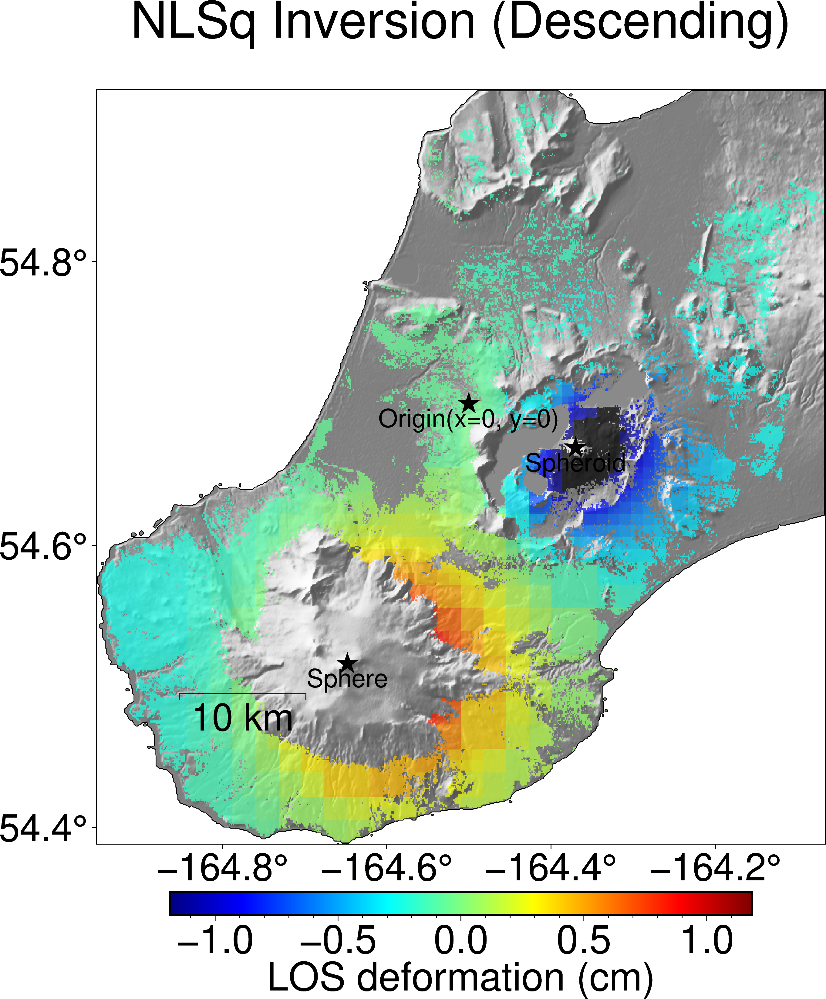

In [14]:
los_des=invin_des.forward(params)
util.plot_insar_pygmt(csvfile_des, los_des, maskfile=mask_des, title='NLSq Inversion (Descending)', points=points, lpoints=lpoints)

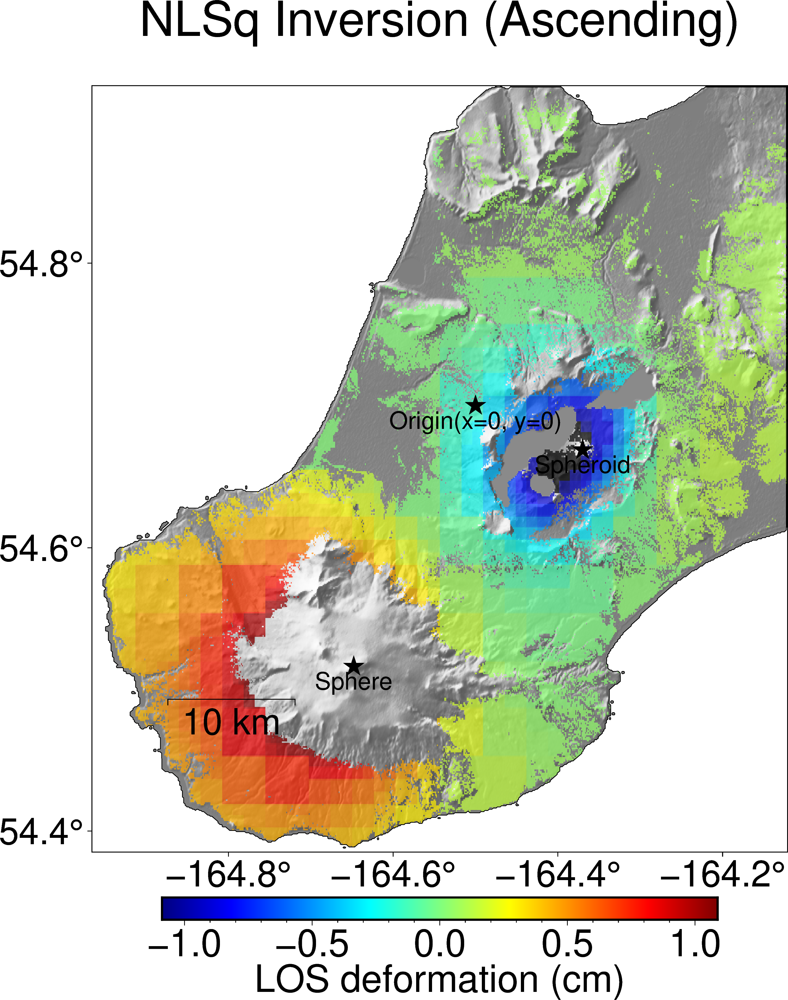

In [15]:
los_asc=invin_asc.forward(params)
util.plot_insar_pygmt(csvfile_asc, los_asc, maskfile=mask_asc, title='NLSq Inversion (Ascending)', points=points, lpoints=lpoints)

grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from -165.18673 to -165.1875
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from -164.0197 to -164.019166667
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from 54.3723509997 to 54.3716666667
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from 54.8385004769 to 54.8391666667


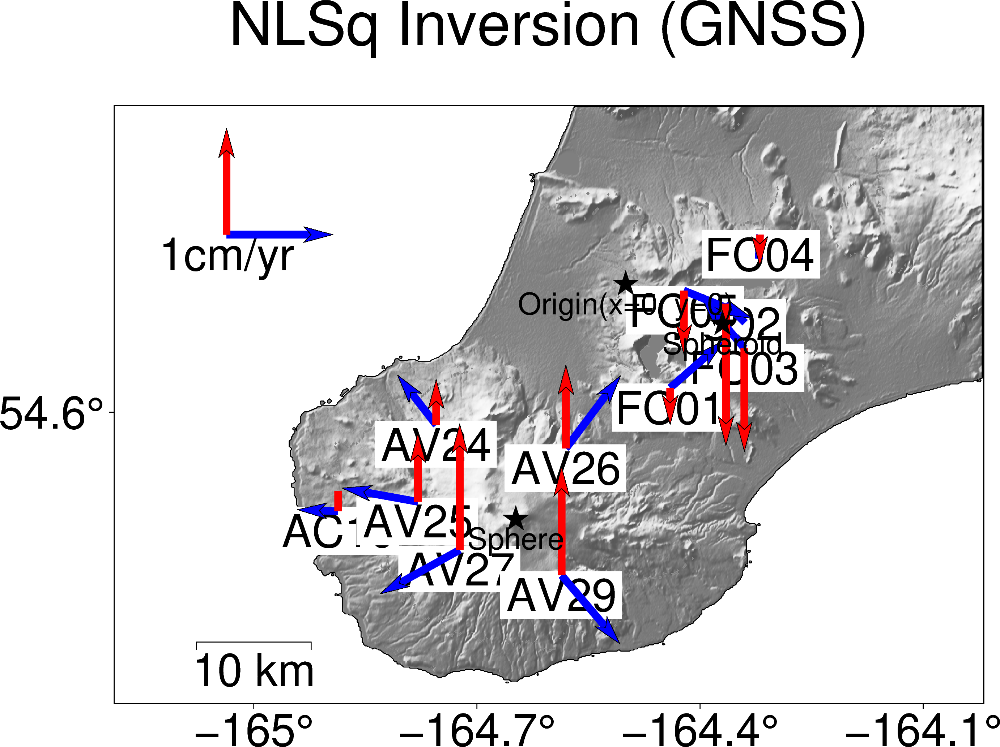

In [16]:
uxsm,uysm,uzsm=invg.forward(params,unravel=False)
util.plot_gnss_pygmt(csvfile_gnss,title='NLSq Inversion (GNSS)',uxs=uxsm,uys=uysm,uzs=uzsm,ignore=['AB06'],points=points,lpoints=lpoints)

# Bayesian inversion

When we run the next cell the Bayesian inversion will start

In [ ]:
trace=inv.mcmc_em('unimak_joint_ymc')

  4%|▎         | 8753/235714 [26:52<10:31:39,  5.99it/s]

The traces from the Bayesian inversion are stored in a .pkl file

In [19]:
import pickle
with open('unimak_joint_ymc.pkl','rb') as handle:
    dic=pickle.load(handle)

trace=[dic[key] for key in dic.keys()]

## Plotting results from Bayesian inversion

Here we use the corner library to plot the posterior distributions and we use the auxiliary objects to plot the results

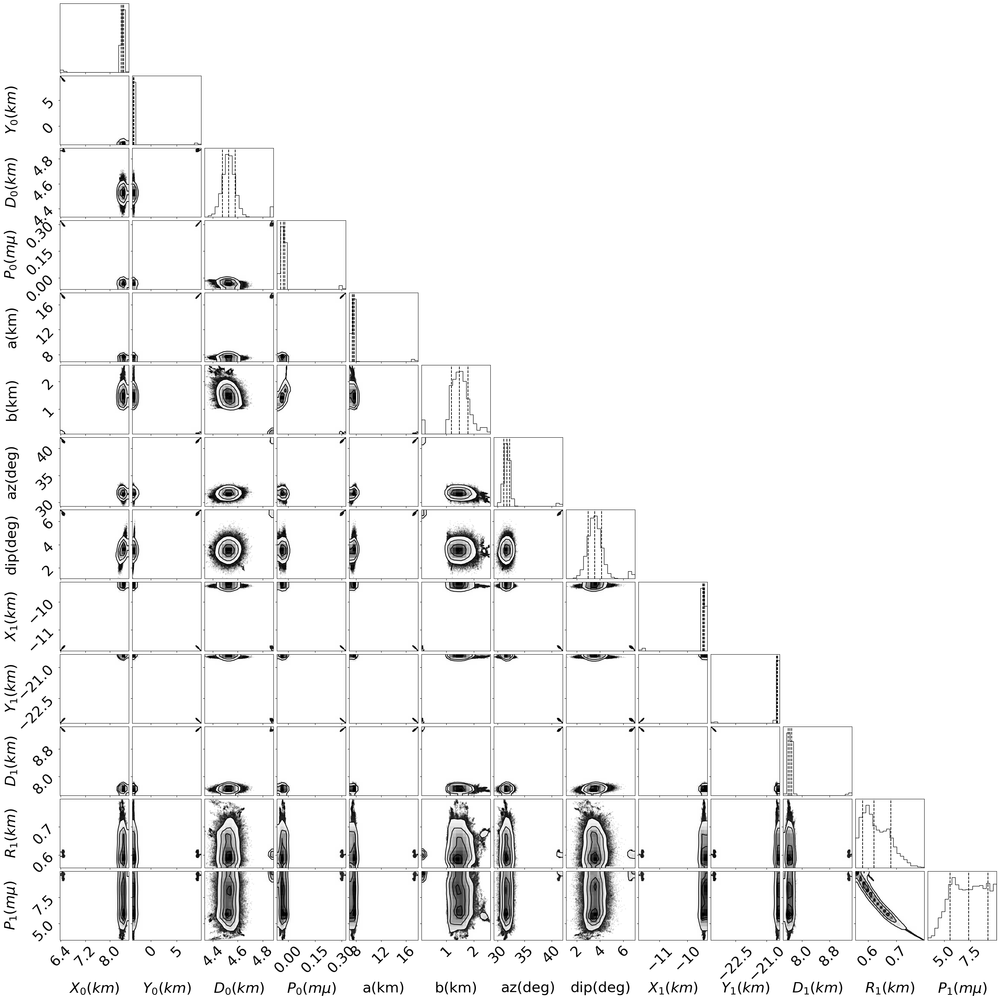

In [20]:
%matplotlib inline
data=[]
labels=[]
parnames,orders=inv.get_parnames_orders()
for i,tr in enumerate(trace):
    data.append(tr[:])
    labels.append(parnames[i])
data=np.vstack(data)
newdata=np.copy(data)

newdata[0:3,:]=newdata[0:3]/1e3
newdata[3,:]=newdata[3,:]*1e3
newdata[4:6,:]=newdata[4:6,:]/1e3
newdata[8:12,:]=newdata[8:12,:]/1e3
newdata[12,:]=newdata[12,:]*1e3

newlabels=[r'$X_{0} (km)$',r'$Y_{0} (km)$',r'$D_{0}(km)$',r'$P_{0} (m\mu)$','a(km)','b(km)','az(deg)','dip(deg)',r'$X_{1} (km)$',r'$Y_{1} (km)$',r'$D_{1}(km)$',r'$R_{1}(km)$',r'$P_{1} (m\mu)$']

plt.rcParams.update({'font.size': 30})

figure = corner.corner(newdata.T, labels=newlabels,max_n_ticks=3,smooth=0.7,labelpad=0.3,
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=False, title_kwargs={"fontsize": 30})
plt.savefig('histograms')

In [21]:
bl=np.array([np.percentile(data[i,:],5) for i in range(data.shape[0])])
bh=np.array([np.percentile(data[i,:],95) for i in range(data.shape[0])])

import copy

obsn=Joint()

obs_ascn=copy.deepcopy(obsin_asc)
obs_ascn.add_err(obs_ascn.err*0+1)
obs_desn=copy.deepcopy(obsin_des)
obs_desn.add_err(obs_desn.err*0+1)

obsn.add_dataset(obs_ascn,wt=1.0)
obsn.add_dataset(obs_desn,wt=1.0)

ygn = Yang(obsn)
#Bounds for parameters
ygn.set_bounds(low_bounds = bl[0:8], high_bounds = bh[0:8])

mctn = Mctigue(obsn)
#Bounds for parameters
mctn.set_bounds(low_bounds = bl[8::], high_bounds = bh[8::])

invb=Inverse(obsn)
invb.register_source(ygn)
invb.register_source(mctn)

In [22]:
paramsn=invb.nlsq()

100%|██████████| 64/64 [02:54<00:00,  2.73s/it]


In [23]:
parnames,orders=invb.get_parnames_orders()
for i,parname in enumerate(parnames):
    print(parname,paramsn[i])

xcen0 8471.709693606843
ycen0 -3487.107971533668
depth0 4629.883268584563
pressure0 -1.133301639282906e-05
a0 7244.28346926584
b0 2026.9542175984554
az0 32.76499682102998
dip0 2.615867707879079
xcen1 -9482.005505466032
ycen1 -20446.55235643422
depth1 7754.284374255122
radius1 574.9919740823786
dP1 0.00882753631593957


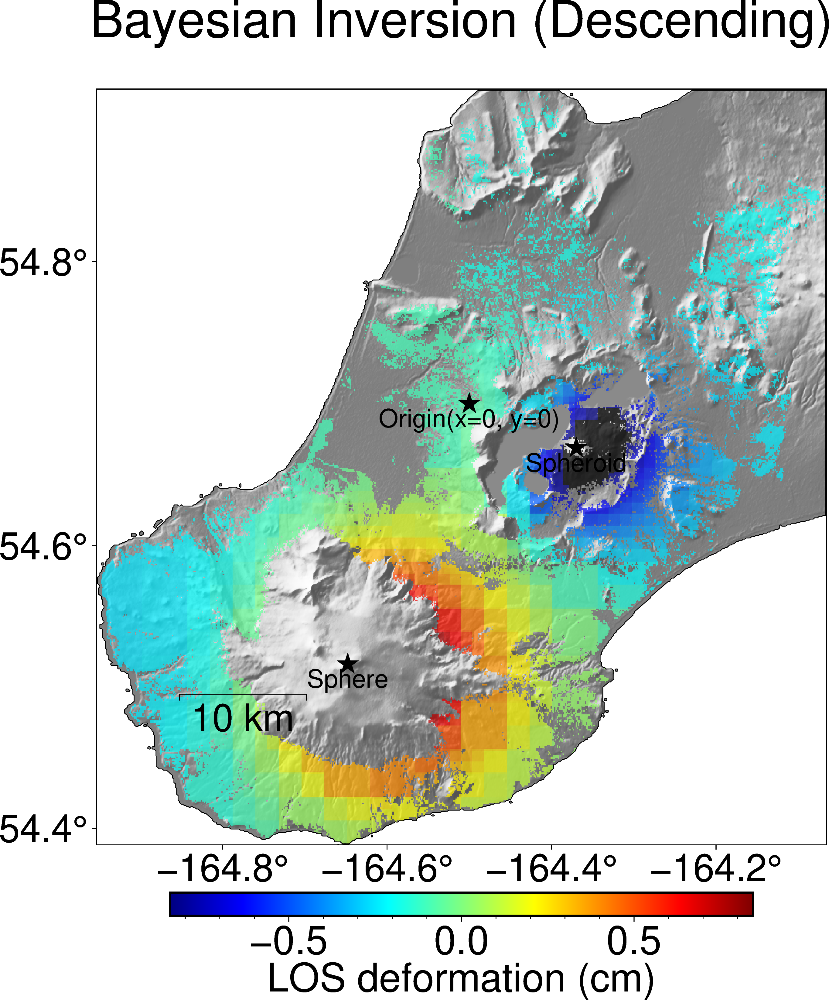

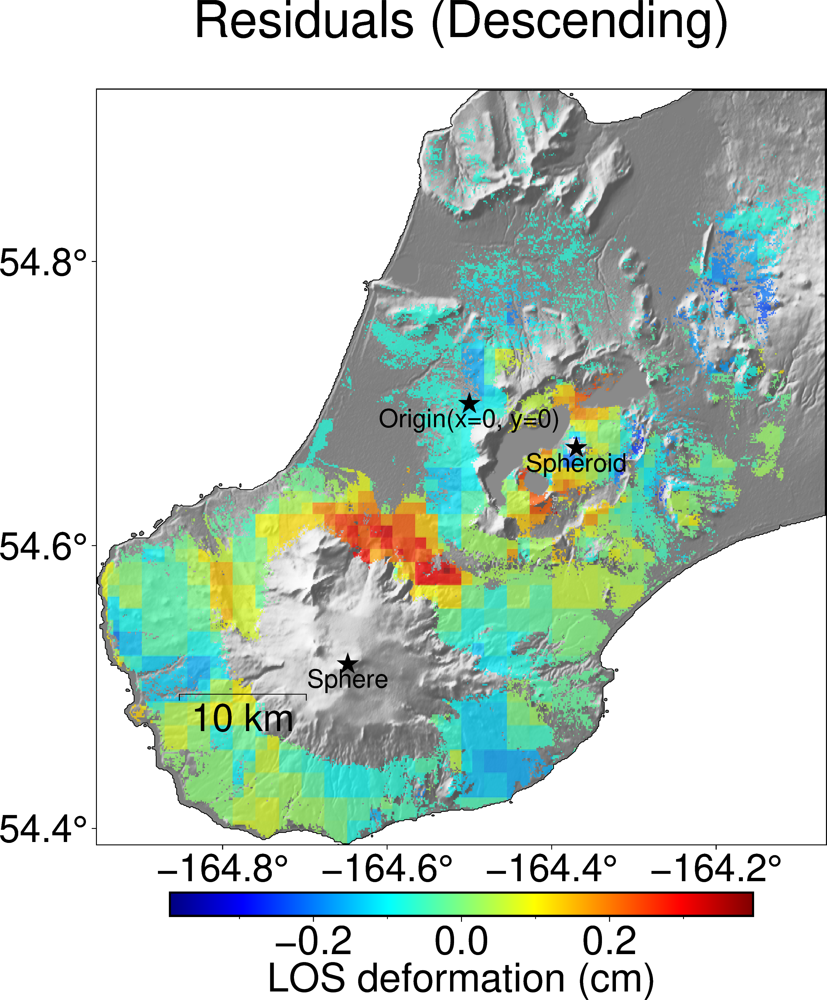

In [24]:
los_des=invin_des.forward(paramsn)
util.plot_insar_pygmt(csvfile_des, los_des, maskfile=mask_des, title='Bayesian Inversion (Descending)', points=points, lpoints=lpoints)
util.plot_insar_pygmt(csvfile_des, obsin_des.get_data()-los_des, maskfile=mask_des, title='Residuals (Descending)', points=points, lpoints=lpoints)

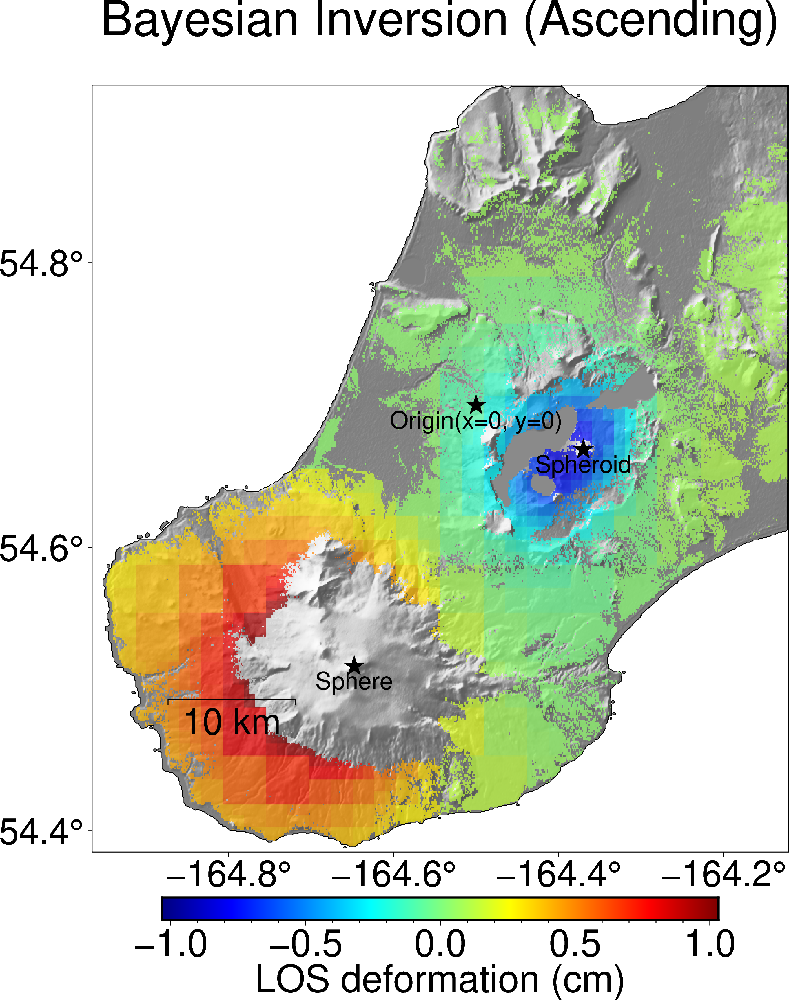

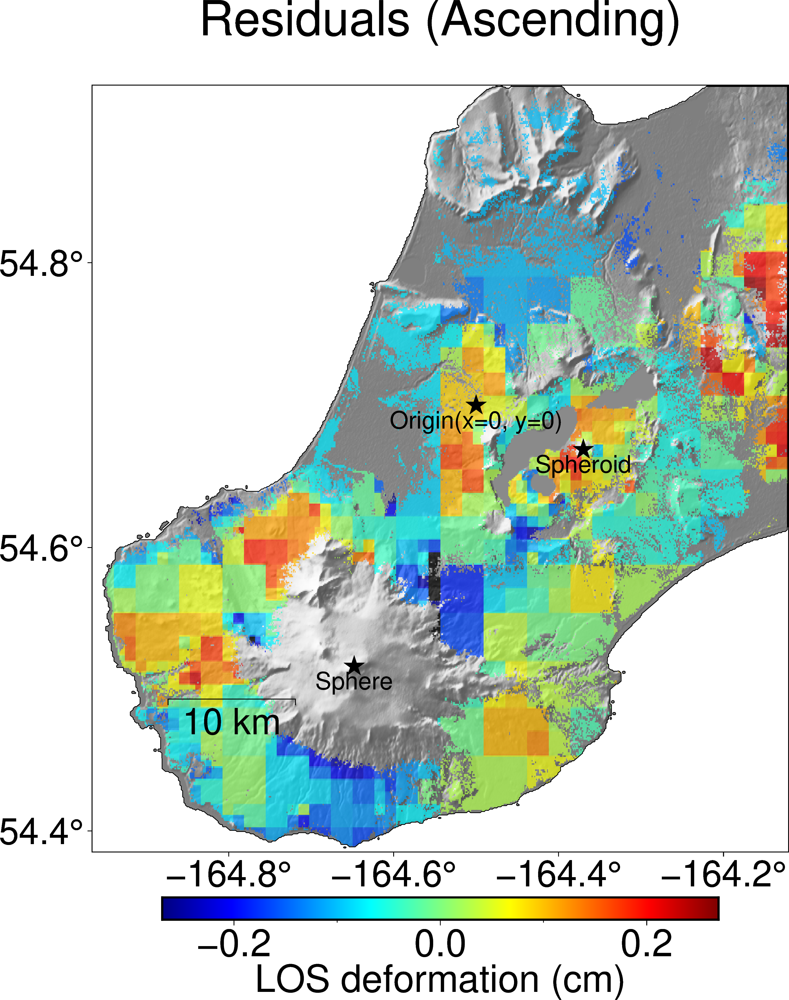

In [25]:
los_asc=invin_asc.forward(paramsn)
util.plot_insar_pygmt(csvfile_asc, los_asc, maskfile=mask_asc, title='Bayesian Inversion (Ascending)', points=points, lpoints=lpoints)
util.plot_insar_pygmt(csvfile_asc, obsin_asc.get_data()-los_asc, maskfile=mask_asc, title='Residuals (Ascending)', points=points, lpoints=lpoints)

grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from -165.18673 to -165.1875
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from -164.0197 to -164.019166667
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from 54.3723509997 to 54.3716666667
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from 54.8385004769 to 54.8391666667


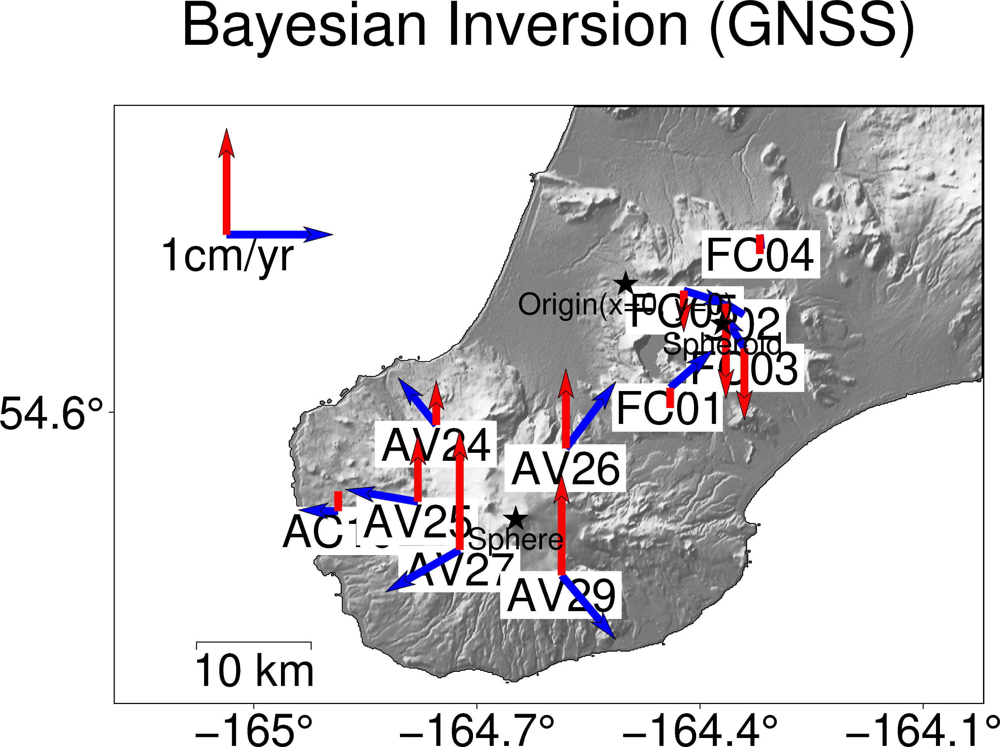

grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from -165.18673 to -165.1875
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from -164.0197 to -164.019166667
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from 54.3723509997 to 54.3716666667
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from 54.8385004769 to 54.8391666667


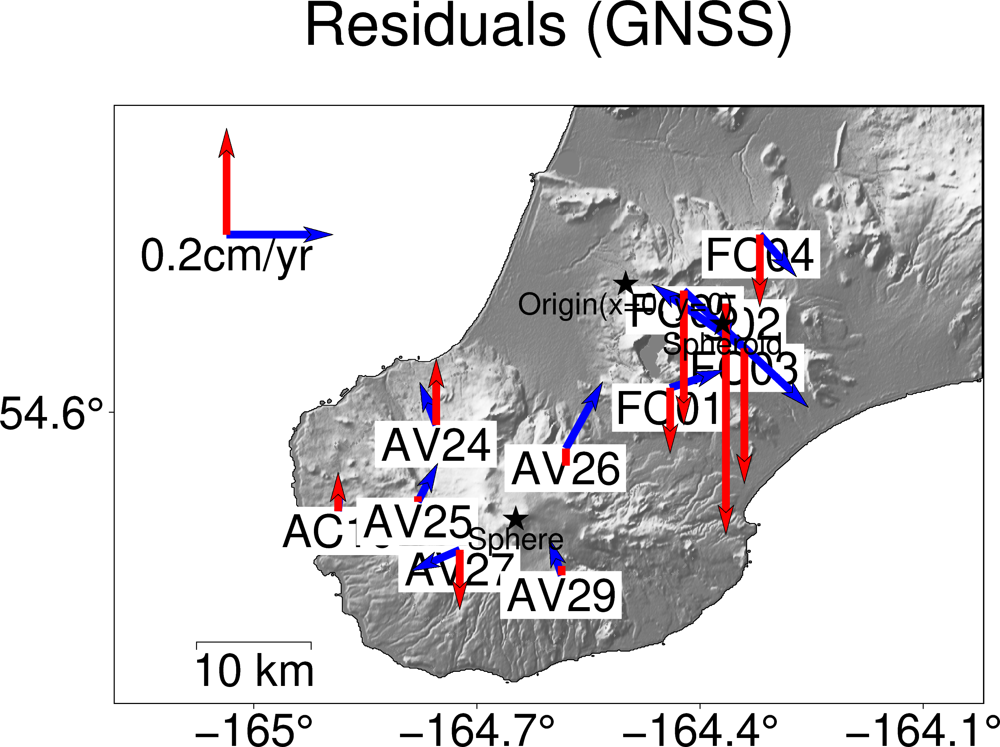

In [28]:
uxsm,uysm,uzsm=invg.forward(paramsn,unravel=False)
uxs,uys,uzs=obsg.get_data(unravel=False)
util.plot_gnss_pygmt(csvfile_gnss,title='Bayesian Inversion (GNSS)',uxs=uxsm,uys=uysm,uzs=uzsm,ignore=['AB06'],points=points,lpoints=lpoints)
util.plot_gnss_pygmt(csvfile_gnss,title='Residuals (GNSS)',uxs=uxs-uxsm,uys=uys-uysm,uzs=uzs-uzsm,ignore=['AB06'],arrowscale=0.002,points=points,lpoints=lpoints)